# VAEs - Variational Autoencoders



### Loading In The Dataset

In [ ]:
# Enabling the GPU:
# Navigate to Edit → Notebook Settings
# Set Hardware Accelerator: GPU

import tensorflow as tf
import numpy as np
import IPython.display  ## For displaying images/gifs generated in your lab

print('Tensorflow Version:', tf.__version__)
print('Num GPUs Available:', len(tf.config.list_physical_devices('GPU')))

!nvidia-smi

Tensorflow Version: 2.14.0
Num GPUs Available: 1
Mon Nov 20 22:11:44 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P8    12W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                       

In [ ]:
import tensorflow as tf
from matplotlib import pyplot as plt
import numpy as np

def input_prep_fn(x):
    return tf.cast(tf.expand_dims(x, -1), tf.float32) / 255.

(X0, L0), (X1, L1) = tf.keras.datasets.mnist.load_data()

X0 = input_prep_fn(X0)
X1 = input_prep_fn(X1)

11490434/11490434 [==============================] - 0s 0us/step


##Simple VAE

In [ ]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Flatten, Reshape
from tensorflow.math import exp, sqrt, square

class VAE(tf.keras.Model):
  def __init__(self, encoder, decoder, mu_layers, logvar_layers, **kwargs):
      super().__init__(**kwargs)
      self.encoder = encoder
      self.decoder = decoder
      self.kld_tracker = tf.keras.metrics.Mean(name="kld")
      self.rec_tracker = tf.keras.metrics.Mean(name="rec")
      self.mu_layers = mu_layers
      self.logvar_layers = logvar_layers


  def call(self, inputs):
      x, label = inputs
      outputs = self.encoder(x)
      outputs = self.latent_ops(outputs)
      return self.decoder(outputs)

  def latent_ops(self, z):
      self.mu = self.mu_layers(z)
      self.logvar = self.logvar_layers(z)
      z = self.sample_z()
      return z

  def compile(self, rec_loss, kld_loss, *args, **kwargs):
      super().compile(*args, **kwargs)
      self.rec_loss = rec_loss
      self.kld_loss = kld_loss

  def sample_z(self):
      e = tf.random.normal(shape=self.mu.shape)
      return self.mu + e * sqrt(exp(self.logvar))

  ##########################################################
  ## Custom batch step methods

  def train_step(self, data): return self.batch_step(data, training=True)
  def test_step(self, data):  return self.batch_step(data, training=False)

  def batch_step(self, data, training=True):
      (x, labels), y = data
      with tf.GradientTape() as tape:
          y_pred = self.call((x, labels))
          kld_loss = self.kld_loss(self.mu, self.logvar)
          rec_loss = self.rec_loss(y, y_pred)
          total_loss = rec_loss + kld_loss
      if training:
          gradients = tape.gradient(total_loss, self.trainable_variables)
          self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))

      self.compiled_metrics.update_state(y, y_pred)
      self.rec_tracker.update_state(rec_loss)
      self.kld_tracker.update_state(kld_loss)
      output = {}
      for metric in self.metrics:
        output = {metric.name: metric.result()}
      output = {**output, 'rec' : self.rec_tracker.result(), 'kld' : self.kld_tracker.result()}
      return output



In [ ]:
conv_kwargs = {
    "kernel_size"         : 4,
    "strides"             : (2,2),
    "padding"             : "SAME",
    "activation"          : tf.keras.layers.LeakyReLU(alpha=0.2),
}


vae_model = VAE(
    encoder = tf.keras.Sequential([
        tf.keras.layers.Conv2D(1, **conv_kwargs),
        tf.keras.layers.Conv2D(16, **conv_kwargs),
        tf.keras.layers.Conv2D(64, **conv_kwargs),
        tf.keras.layers.Flatten(),
    ], name='ae_encoder'),
    decoder = tf.keras.Sequential([
        tf.keras.layers.Dense(units=1568, activation='leaky_relu'),
        tf.keras.layers.Reshape(target_shape=(7, 7, 32)),
        tf.keras.layers.Conv2DTranspose(64, **conv_kwargs),
        tf.keras.layers.Conv2DTranspose(16, **conv_kwargs),
        tf.keras.layers.Conv2DTranspose(1, 4, padding='SAME', activation='sigmoid'),
    ], name='ae_decoder'),
    mu_layers = Dense(2, activation='leaky_relu'),
    logvar_layers = Dense(2, activation='leaky_relu'))

vae_model((X0[:5], L0[:5]))
vae_model.summary()
vae_model.encoder.summary()
vae_model.decoder.summary()

Model: "vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 ae_encoder (Sequential)     (5, 1024)                 16737     
                                                                 
 ae_decoder (Sequential)     (5, 28, 28, 1)            54193     
                                                                 
 dense_1 (Dense)             multiple                  2050      
                                                                 
 dense_2 (Dense)             multiple                  2050      
                                                                 
Total params: 75,034
Trainable params: 75,030
Non-trainable params: 4
_________________________________________________________________
Model: "ae_encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (5, 14, 14

In [ ]:
def kld_loss(logvar, mu):
    return 0.5 * tf.reduce_sum(-logvar + (mu ** 2) -1 + exp(logvar), axis=1)

def rec_loss(x_true, x_pred):
    return tf.reduce_sum(tf.keras.losses.binary_crossentropy(x_true, x_pred), axis=(1, 2))

vae_model.compile(
    optimizer   = tf.keras.optimizers.Adam(5e-3),
    rec_loss    = rec_loss,
    kld_loss    = kld_loss,
    metrics     = [
        tf.keras.metrics.MeanSquaredError(),
        tf.keras.metrics.BinaryCrossentropy()
    ]
)
subset = 60000
vae_model.fit(
    (X0[:subset], L0[:subset]), X0[:subset],
    epochs     = 10,
    batch_size = 100,
    validation_data = ((X1[:1000], L1[:1000]), X1[:1000]),
);

Epoch 1/10
600/600 [==============================] - 7s 6ms/step - rec: 178.9799 - kld: 4.7351 - val_rec: 161.9987 - val_kld: 4.2160
Epoch 2/10
600/600 [==============================] - 3s 6ms/step - rec: 161.9712 - kld: 5.3382 - val_rec: 156.5086 - val_kld: 5.7213
Epoch 3/10
600/600 [==============================] - 3s 6ms/step - rec: 158.9989 - kld: 5.8167 - val_rec: 156.3336 - val_kld: 5.7321
Epoch 4/10
600/600 [==============================] - 3s 6ms/step - rec: 157.5370 - kld: 6.0271 - val_rec: 154.4371 - val_kld: 5.6873
Epoch 5/10
600/600 [==============================] - 3s 6ms/step - rec: 156.4610 - kld: 6.1946 - val_rec: 152.8221 - val_kld: 6.9238
Epoch 6/10
600/600 [==============================] - 3s 6ms/step - rec: 155.6122 - kld: 6.3488 - val_rec: 153.2331 - val_kld: 6.2286
Epoch 7/10
600/600 [==============================] - 3s 6ms/step - rec: 155.0648 - kld: 6.4378 - val_rec: 152.9121 - val_kld: 6.0982
Epoch 8/10
600/600 [==============================] - 3s 6ms/s

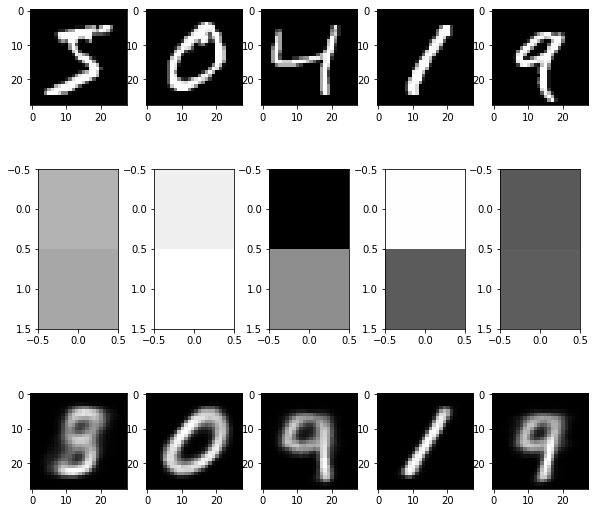

In [ ]:
fig, axs = plt.subplots(nrows=3, ncols=5, figsize=(10, 10))

x  = X0[:5]
xp = vae_model.encoder(x)
zp = vae_model.latent_ops(xp)
z  = vae_model.decoder(zp)

min_zp = np.min(zp)
max_zp = np.max(zp)
scale_zp = lambda v: (v - min_zp) / (max_zp - min_zp)

for i in range(5):
    axs[0][i].imshow(x[i,:,:,0], cmap='gray')
    axs[1][i].imshow(tf.reshape(scale_zp(zp[i]), (2, 1)), cmap='gray', vmin=0, vmax=1)
    axs[2][i].imshow(z[i,:,:,0], cmap='gray')

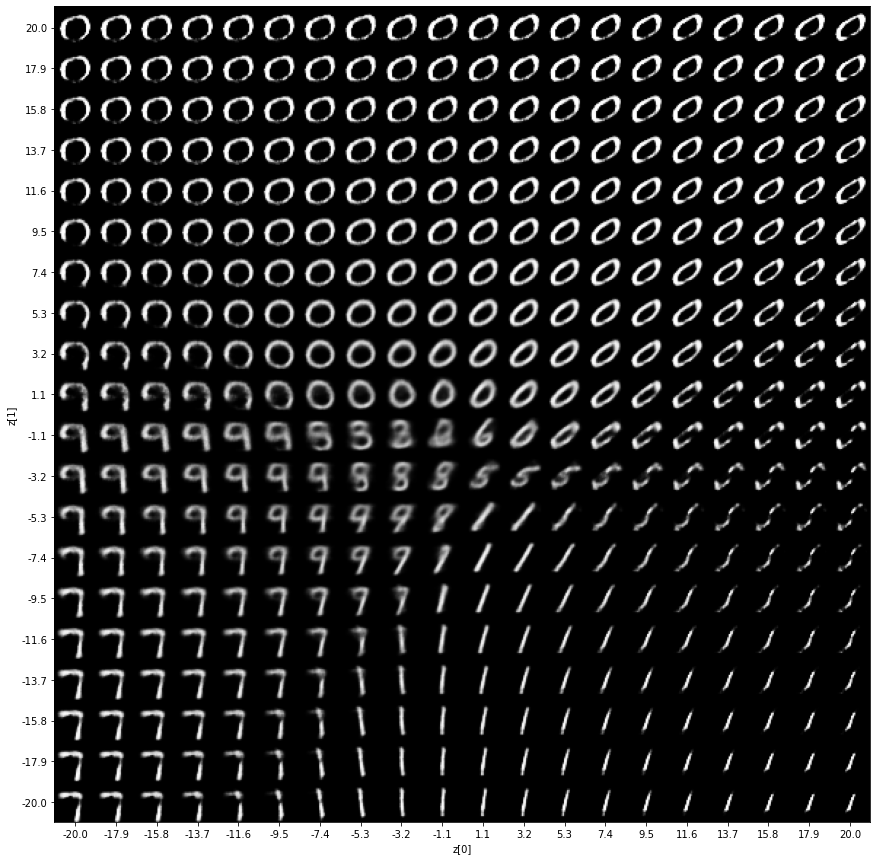

In [ ]:
def plot_latent_space(vae, n=20, figsize=15, digit_size=28):
    # display a n*n 2D manifold of digits
    scale = 20.0
    figure = np.zeros((digit_size * n, digit_size * n))
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([[xi, yi]])
            x_decoded = vae.decoder(z_sample)
            digit = x_decoded[0, :, :, 0]
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="gray")
    plt.show()


plot_latent_space(vae_model)

## Partially-Conditioned VAE

In [ ]:
class CVAE(VAE):
    def call(self, inputs):
        x, label = inputs
        label = tf.one_hot(label, 10)

        encoder = self.encoder(x)
        latent = self.latent_ops(encoder)

        concatted = tf.concat([latent, label], axis=-1)
        outputs = self.decoder(concatted)
        return outputs

In [ ]:
conv_kwargs = {
    "kernel_size"         : 4,
    "strides"             : (2,2),
    "padding"             : "SAME",
    "activation"          : tf.keras.layers.LeakyReLU(alpha=0.2),
}


cvae_model = CVAE(
    encoder = tf.keras.Sequential([
        tf.keras.layers.Conv2D(1, **conv_kwargs),
        tf.keras.layers.Conv2D(16, **conv_kwargs),
        tf.keras.layers.Conv2D(64, **conv_kwargs),
        tf.keras.layers.Flatten(),
    ], name='cae_encoder'),
    decoder = tf.keras.Sequential([
        tf.keras.layers.Dense(units=1568, activation='leaky_relu'),
        tf.keras.layers.Reshape(target_shape=(7, 7, 32)),
        tf.keras.layers.Conv2DTranspose(64, **conv_kwargs),
        tf.keras.layers.Conv2DTranspose(16, **conv_kwargs),
        tf.keras.layers.Conv2DTranspose(1, 4, padding='SAME', activation='sigmoid'),
    ], name='cae_decoder'),
    mu_layers = Dense(2, activation='leaky_relu'),
    logvar_layers = Dense(2, activation='leaky_relu'))

cvae_model((X0[:5], L0[:5]))
cvae_model.summary()
cvae_model.encoder.summary()
cvae_model.decoder.summary()

Model: "cvae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 cae_encoder (Sequential)    (5, 1024)                 16737     
                                                                 
 cae_decoder (Sequential)    (5, 28, 28, 1)            69873     
                                                                 
 dense_4 (Dense)             multiple                  2050      
                                                                 
 dense_5 (Dense)             multiple                  2050      
                                                                 
Total params: 90,714
Trainable params: 90,710
Non-trainable params: 4
_________________________________________________________________
Model: "cae_encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (5, 14, 

In [ ]:
def kld_loss(logvar, mu):
    return 0.5 * tf.reduce_sum(-logvar + (mu ** 2) -1 + exp(logvar), axis=1)

def rec_loss(x_true, x_pred):
    return tf.reduce_sum(tf.keras.losses.binary_crossentropy(x_true, x_pred), axis=(1, 2))

cvae_model.compile(
    optimizer   = tf.keras.optimizers.Adam(5e-3),
    rec_loss    = rec_loss,
    kld_loss    = kld_loss,
    metrics     = [tf.keras.metrics.MeanSquaredError(), tf.keras.metrics.BinaryCrossentropy()]
)
subset = 60000
cvae_model.fit(
    (X0[:subset], L0[:subset]), X0[:subset],
    epochs     = 10,
    batch_size = 100,
    validation_data = ((X1[:1000], L1[:1000]), X1[:1000]),
);

Epoch 1/10
600/600 [==============================] - 5s 6ms/step - rec: 152.7517 - kld: 3.6631 - val_rec: 139.8950 - val_kld: 3.6309
Epoch 2/10
600/600 [==============================] - 3s 6ms/step - rec: 137.5858 - kld: 4.2156 - val_rec: 136.0029 - val_kld: 4.1974
Epoch 3/10
600/600 [==============================] - 3s 6ms/step - rec: 135.9729 - kld: 4.3067 - val_rec: 134.8874 - val_kld: 4.4018
Epoch 4/10
600/600 [==============================] - 4s 6ms/step - rec: 135.0009 - kld: 4.3834 - val_rec: 134.2325 - val_kld: 4.1637
Epoch 5/10
600/600 [==============================] - 3s 6ms/step - rec: 134.4202 - kld: 4.4231 - val_rec: 133.9889 - val_kld: 4.3978
Epoch 6/10
600/600 [==============================] - 4s 7ms/step - rec: 133.9534 - kld: 4.4581 - val_rec: 134.9474 - val_kld: 3.9084
Epoch 7/10
600/600 [==============================] - 4s 6ms/step - rec: 133.5590 - kld: 4.4723 - val_rec: 133.0283 - val_kld: 4.3837
Epoch 8/10
600/600 [==============================] - 3s 6ms/s

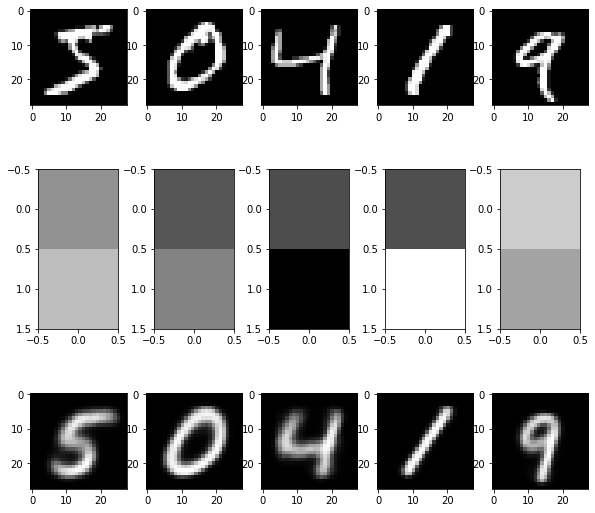

In [ ]:
fig, axs = plt.subplots(nrows=3, ncols=5, figsize=(10, 10))

x  = X0[:5]
xp = cvae_model.encoder(x)
zp = cvae_model.latent_ops(xp)
zp_lab = tf.concat([zp, tf.one_hot(L0[:5], 10)], axis=-1)
z  = cvae_model.decoder(zp_lab)

min_zp = np.min(zp)
max_zp = np.max(zp)
scale_zp = lambda v: (v - min_zp) / (max_zp - min_zp)

for i in range(5):
    axs[0][i].imshow(x[i,:,:,0], cmap='gray')
    axs[1][i].imshow(tf.reshape(scale_zp(zp[i]), (2, 1)), cmap='gray', vmin=0, vmax=1)
    axs[2][i].imshow(z[i,:,:,0] * 0.5 + 1, cmap='gray')

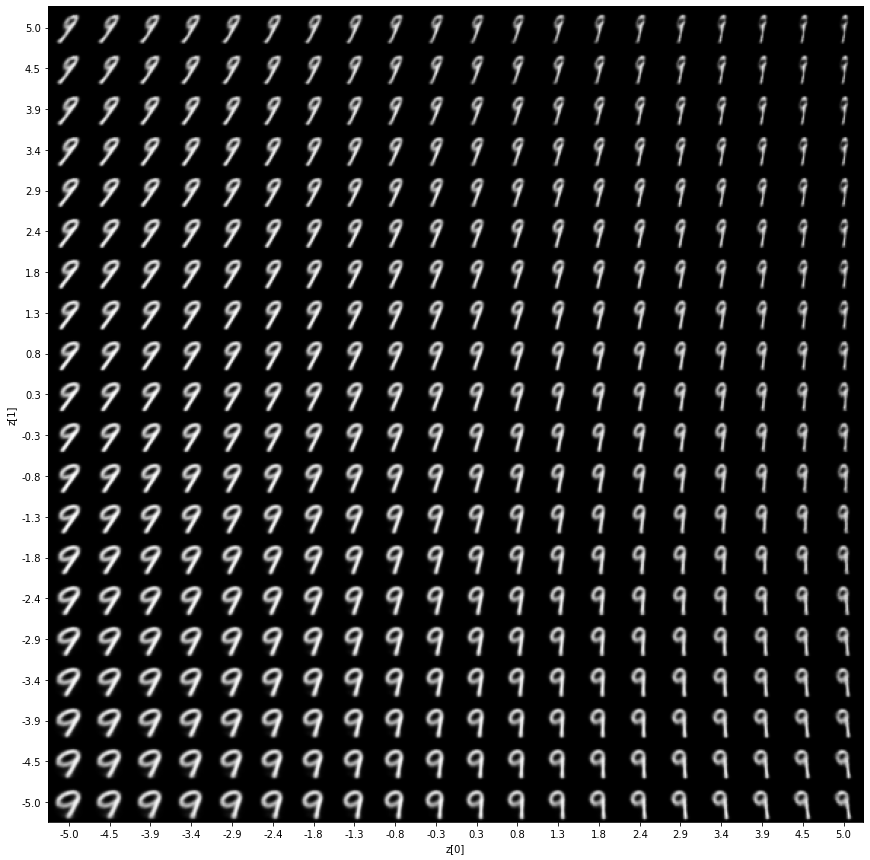

In [ ]:
def plot_latent_space(vae, n=20, label=0, figsize=15, digit_size=28):
    # display a n*n 2D manifold of digits
    scale = 5.0
    figure = np.zeros((digit_size * n, digit_size * n))
    label_ohe = tf.one_hot(label, 10)
    # linearly spaced coordinates corresponding to the 2D plot
    # of digit classes in the latent space
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = np.array([tf.concat([[xi, yi], label_ohe], -1)])
            x_decoded = vae.decoder(z_sample)
            digit = x_decoded[0, :, :, 0]
            figure[
                i * digit_size : (i + 1) * digit_size,
                j * digit_size : (j + 1) * digit_size,
            ] = digit

    plt.figure(figsize=(figsize, figsize))
    start_range = digit_size // 2
    end_range = n * digit_size + start_range
    pixel_range = np.arange(start_range, end_range, digit_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.imshow(figure, cmap="gray")
    plt.show()


plot_latent_space(cvae_model, label=9)

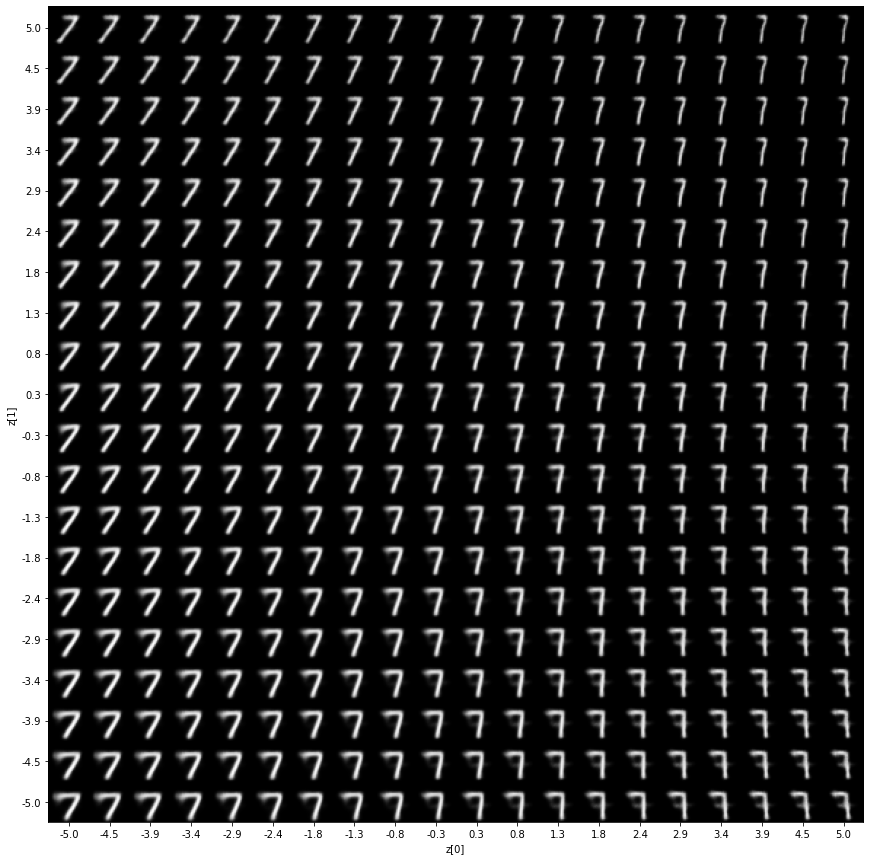

In [ ]:
plot_latent_space(cvae_model, label=7)

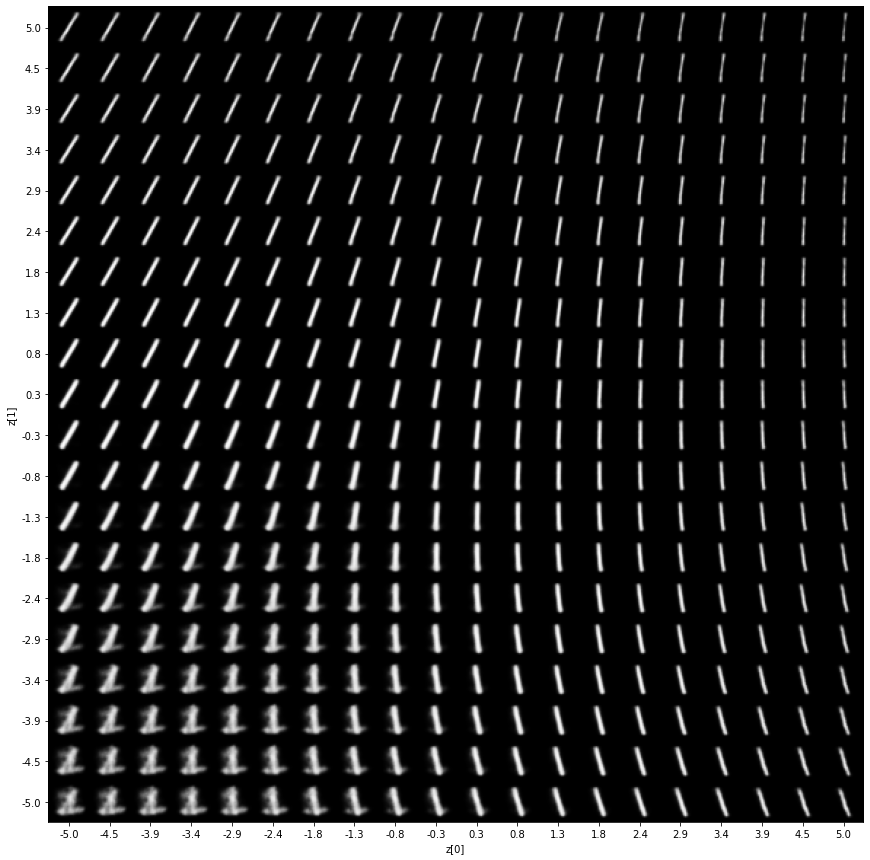

In [ ]:
plot_latent_space(cvae_model, label=1)

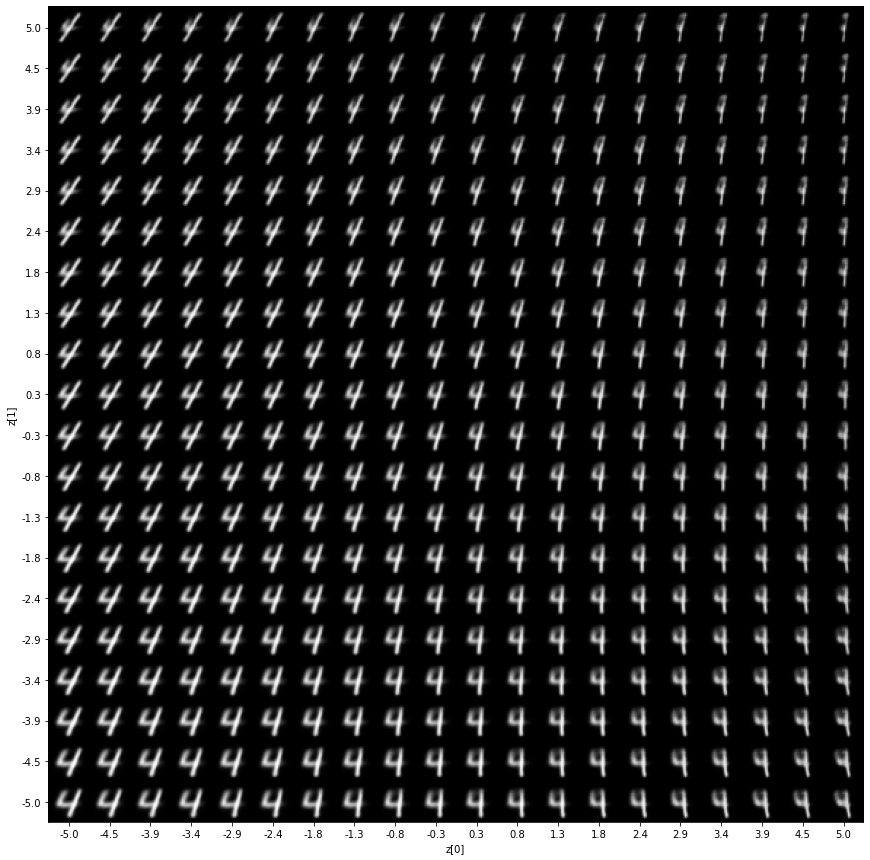

In [ ]:
plot_latent_space(cvae_model, label=4)

## A Latent Walk Between Digits

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import io

interp_labels = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 0]

time_steps = 11

z0_opts = (-.5, 0.1, .5)
z1_opts = (-.5, 0.1, .5)

interp_labels = [tf.one_hot(x, 10) for x in interp_labels]

def fig2img(fig):
    """
    Convert a Matplotlib figure to a PIL Image and return it
    https://stackoverflow.com/a/61754995/5003309
    """
    buf = io.BytesIO()
    fig.savefig(buf)
    buf.seek(0)
    return Image.open(buf)

imgs = []

total_frames = time_steps * (len(interp_labels) - 1)
for lab_idx, (lab0, lab1) in enumerate(zip(interp_labels[:-1], interp_labels[1:])):
    ## For every adjacent pair of labels
    for frame, lab in enumerate(np.linspace(lab0, lab1, time_steps)):
        ## Compute a span of labels going progressively from one to the other
        fig, axs = plt.subplots(nrows=len(z0_opts), ncols=len(z1_opts), figsize=(10, 10))
        fig.suptitle(f'Label {np.round(lab, 1)}', fontsize=20)
        for j, z0 in enumerate(z0_opts):
            for k, z1 in enumerate(z1_opts):
                ## Find every pair of latent coordinates, and find the prediction
                ## of current walked label at that z coordinate
                z_lab = np.array([tf.concat([[z0, z1], lab], axis=-1)])
                x_pred = cvae_model.decoder(z_lab)[0, :, :, 0]
                axs[j][k].imshow(x_pred, cmap='gray', vmin=0, vmax=1)
        ## Log the fact that this image was generated, and add to frames list
        curr_frame = time_steps * lab_idx + frame
        print(f'\rPrinted frame {1 + time_steps * lab_idx + frame}/{total_frames}', end='')
        imgs += [fig2img(fig)]
        plt.close(fig)

Printed frame 110/110

In [ ]:
imgs[0].save(
    'latent_walk.gif', save_all=True, append_images=imgs[1:],
    loop=0, duration=100)

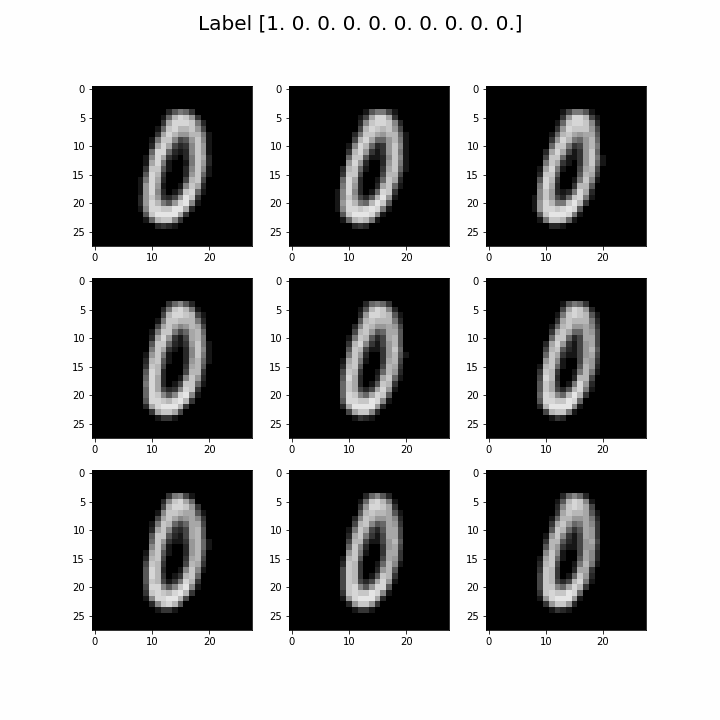

In [ ]:
IPython.display.Image(open('latent_walk.gif','rb').read())